<a href="https://colab.research.google.com/github/amvalero10/PDG_music_transformer/blob/master/PDG_Fugue_Transformer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Generación de música con redes neuronales Transformer

### El siguiente repositorio fue creado apartir del trabajo de:

https://github.com/asigalov61/SuperPiano


Based on 2019 ICLR paper by Cheng-Zhi Anna Huang, Google Brain and Damon Gwinn's code/repo https://github.com/gwinndr/MusicTransformer-Pytorch

Contribuciones del repositorio original:

* Kevin-Yang https://github.com/jason9693/midi-neural-processor

* gudgud96 for fixing Kevin's MIDI Encoder properly https://github.com/gudgud96

* jinyi12, Zac Koh, Akamight, Zhang https://github.com/COMP6248-Reproducability-Challenge/music-transformer-comp6248



## Configuracion Entorno - de Trabajo

In [ ]:
# gpu asignada

gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Wed Nov 16 19:05:06 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   33C    P0    24W / 300W |      0MiB / 16160MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
# ram asiganda

from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 27.3 gigabytes of available RAM

You are using a high-RAM runtime!


In [ ]:
# conexion con Drive
from google.colab import drive
drive.mount('/content/drive')

### Instalación de dependencias

In [1]:
!git clone https://github.com/asigalov61/midi-neural-processor
!git clone https://github.com/asigalov61/MusicTransformer-Pytorch
!pip install tqdm
!pip install progress
!pip install pretty-midi
!pip install pypianoroll
!pip install matplotlib
!pip install librosa
!pip install scipy
!pip install pillow
!apt install fluidsynth #Pip does not work for some reason. Only apt works
!pip install midi2audio
!pip install mir_eval
!cp /usr/share/sounds/sf2/FluidR3_GM.sf2 /content/font.sf2

Cloning into 'midi-neural-processor'...
remote: Enumerating objects: 26, done.
remote: Total 26 (delta 0), reused 0 (delta 0), pack-reused 26
Unpacking objects: 100% (26/26), done.
Cloning into 'MusicTransformer-Pytorch'...
remote: Enumerating objects: 385, done.
remote: Counting objects: 100% (138/138), done.
remote: Compressing objects: 100% (54/54), done.
remote: Total 385 (delta 99), reused 84 (delta 84), pack-reused 247
Receiving objects: 100% (385/385), 100.31 KiB | 342.00 KiB/s, done.
Resolving deltas: 100% (200/200), done.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for progress: filename=progress-1.6-py3-none-any.whl size=9630 sha256=d0d249f5a32dc179e2d9fa56c7c232a2bfeb8c795000106804a42126f2d573b0
  Stored in directory: /root/.cache/pip/wheels/8e/d7/61/498d8e27dc11e9805b01eb3539e2ee344436fc226daeb5fe87
Success

### Importación de Librerias

In [2]:
import numpy as np
import pickle
import os
import sys
import math
import random
# For plotting
import pypianoroll
from pypianoroll import Multitrack, Track
import matplotlib
import matplotlib.pyplot as plt
#matplotlib.use('SVG')
#%matplotlib inline
#matplotlib.get_backend()
import mir_eval.display
import librosa
import librosa.display
# For rendering output audio
import pretty_midi
from midi2audio import FluidSynth
from google.colab import output
from IPython.display import display, Javascript, HTML, Audio



## Preparación de los datos

 
 


### Creación de estructura de directorios para el DataSet y preparación para el procesador midi


In [3]:
!mkdir '/content/MusicTransformer-Pytorch/dataset/e_piano/'
!mkdir '/content/MusicTransformer-Pytorch/dataset/e_piano/train'
!mkdir '/content/MusicTransformer-Pytorch/dataset/e_piano/test'
!mkdir '/content/MusicTransformer-Pytorch/dataset/e_piano/val'
!mkdir '/content/MusicTransformer-Pytorch/dataset/e_piano/custom_midis'

%cd /content/
!mv midi-neural-processor midi_processor
%cd /content/MusicTransformer-Pytorch/

mkdir: cannot create directory ‘/content/MusicTransformer-Pytorch/dataset/e_piano/’: File exists
mkdir: cannot create directory ‘/content/MusicTransformer-Pytorch/dataset/e_piano/train’: File exists
mkdir: cannot create directory ‘/content/MusicTransformer-Pytorch/dataset/e_piano/test’: File exists
mkdir: cannot create directory ‘/content/MusicTransformer-Pytorch/dataset/e_piano/val’: File exists
mkdir: cannot create directory ‘/content/MusicTransformer-Pytorch/dataset/e_piano/custom_midis’: File exists
/content
/content/MusicTransformer-Pytorch


Se agrega un archivo midis.zip que contiene 4095 archivos midi correspodientes a 1176 composiciones de J.S.Bach.

Se extrae todos los archivos y el archivo midis.zip es eliminado.

In [4]:
%cd '/content/MusicTransformer-Pytorch/dataset/e_piano/custom_midis'
!unzip -j '/content/MusicTransformer-Pytorch/dataset/e_piano/custom_midis/midis.zip'
!rm '/content/MusicTransformer-Pytorch/dataset/e_piano/custom_midis/midis.zip'

/content/MusicTransformer-Pytorch/dataset/e_piano/custom_midis
Archive:  /content/MusicTransformer-Pytorch/dataset/e_piano/custom_midis/midis.zip
  inflating: bwv0001_01.mid          
  inflating: bwv0001_02.mid          
  inflating: bwv0001_03.mid          
  inflating: bwv0001_04.mid          
  inflating: bwv0001_05.mid          
  inflating: bwv0001_06.mid          
  inflating: bwv0002_01.mid          
  inflating: bwv0002_02.mid          
  inflating: bwv0002_03.mid          
  inflating: bwv0002_04.mid          
  inflating: bwv0002_05.mid          
  inflating: bwv0002_06.mid          
  inflating: bwv0003_01.mid          
  inflating: bwv0003_02.mid          
  inflating: bwv0003_03.mid          
  inflating: bwv0003_04.mid          
  inflating: bwv0003_05.mid          
  inflating: bwv0003_06.mid          
  inflating: bwv0004_01.mid          
  inflating: bwv0004_02.mid          
  inflating: bwv0004_03.mid          
  inflating: bwv0004_04.mid          
  inflating: bwv00

Procesamos la data, dividimos la data entre test y validation para luego convertir cada archivo en .pickle. Posteriormente toda la data sera usada para entrenamiento.



In [5]:
%cd /content/MusicTransformer-Pytorch
from processor import encode_midi

import os
import random


%cd '/content/MusicTransformer-Pytorch/dataset/e_piano/custom_midis'

custom_MIDI_DataSet_dir = '/content/MusicTransformer-Pytorch/dataset/e_piano/custom_midis'

train_dir = '/content/MusicTransformer-Pytorch/dataset/e_piano/train' # split_type = 0
val_dir = '/content/MusicTransformer-Pytorch/dataset/e_piano/val' # split_type = 1
test_dir = '/content/MusicTransformer-Pytorch/dataset/e_piano/test' # split_type = 2


total_count = 0
train_count = 0
val_count   = 0
test_count  = 0

# ingreso los parametros para la division de dato
num_total = 4095  #total
num_train = 3071  # 75%
num_val   = 615   # 15%
num_test  = 409   # 10%


f_ext = '.pickle'
fileList = os.listdir(custom_MIDI_DataSet_dir)
for file in fileList:
     
    # we gonna split by a random selection for now
    split = random.randint(0, 2)

    # compruebo si ya se tiene la cantidad en cada conjunto
    while(True):
      if(split == 0 and train_count >= num_train ):
        split = random.randint(1, 2)
      elif(split == 1 and val_count >= num_val ):
        split = random.randint(0, 2)
      elif(split == 2 and test_count >= num_test ):
        split = random.randint(0, 1)
      else:
        break
       

    if (split == 0):
         o_file = os.path.join(train_dir, file+f_ext)
         train_count += 1
         total_count += 1

    elif (split == 1):
         o_file = os.path.join(val_dir, file+f_ext)
         val_count += 1
         total_count +=1

    elif (split == 2):
         o_file = os.path.join(test_dir, file+f_ext)
         test_count += 1
         total_count +=1

    try:

      prepped = encode_midi(file)
      o_stream = open(o_file, "wb")
      pickle.dump(prepped, o_stream)
      o_stream.close()
   
      print(file)
      print(o_file)
      print('Coverted!')  
      print('--------------------------------------------------------------------------------')
      print('')
    except KeyboardInterrupt: 
      raise   
    except:
      print('Bad file. Skipping...')


print('Done')
print("Num Train:", train_count)
print("Num Val:", val_count)
print("Num Test:", test_count)
print("Total Count:", total_count)

%cd /content/MusicTransformer-Pytorch

Se han truncado las últimas 5000 líneas del flujo de salida.
bwv0080_06.mid
/content/MusicTransformer-Pytorch/dataset/e_piano/train/bwv0080_06.mid.pickle
Coverted!
--------------------------------------------------------------------------------

bwv1130_03.mid
/content/MusicTransformer-Pytorch/dataset/e_piano/train/bwv1130_03.mid.pickle
Coverted!
--------------------------------------------------------------------------------

bwv0246_28.mid
/content/MusicTransformer-Pytorch/dataset/e_piano/train/bwv0246_28.mid.pickle
Coverted!
--------------------------------------------------------------------------------

bwv0227_09.mid
/content/MusicTransformer-Pytorch/dataset/e_piano/train/bwv0227_09.mid.pickle
Coverted!
--------------------------------------------------------------------------------

bwv0815a_03.mid
/content/MusicTransformer-Pytorch/dataset/e_piano/train/bwv0815a_03.mid.pickle
Coverted!
--------------------------------------------------------------------------------

bwv0246_56.m

## Entreniamiento del modelo

En este punto se inicia el entrenamiento del modelo con la data que se encuentra en train. Se busca iterar el modelo hasta 120 epochs.

Los parametros de entrenamiento para el modelo son:


```
rpr: True
lr: None
ce_smoothing: None
batch_size: 4
epochs: 120
max_sequence: 2048
n_layers: 6
num_heads: 8
d_model: 512
dim_feedforward: 1024
dropout: 0.1
```





In [17]:
batch_size = 4
number_of_training_epochs = 120
maximum_output_MIDI_sequence = 2048
!python3 train.py -output_dir rpr --rpr -batch_size=$batch_size -epochs=$number_of_training_epochs -max_sequence=$maximum_output_MIDI_sequence #-n_layers -num_heads -d_model -dim_feedforward

Se han truncado las últimas 5000 líneas del flujo de salida.
Train loss: 0.3095735013484955

Time (s): 0.25563907623291016

Epoch 72  Batch 535 / 766
LR: 0.00018858007380974118
Train loss: 0.423464298248291

Time (s): 0.25629281997680664

Epoch 72  Batch 536 / 766
LR: 0.00018857835700288584
Train loss: 0.27424198389053345

Time (s): 0.25533390045166016

Epoch 72  Batch 537 / 766
LR: 0.00018857664024291837
Train loss: 0.4549676477909088

Time (s): 0.25577425956726074

Epoch 72  Batch 538 / 766
LR: 0.00018857492352983662
Train loss: 0.4459717571735382

Time (s): 0.2550537586212158

Epoch 72  Batch 539 / 766
LR: 0.00018857320686363848
Train loss: 0.34955790638923645

Time (s): 0.2561817169189453

Epoch 72  Batch 540 / 766
LR: 0.0001885714902443218
Train loss: 0.3559306859970093

Time (s): 0.2556889057159424

Epoch 72  Batch 541 / 766
LR: 0.0001885697736718844
Train loss: 0.35926365852355957

Time (s): 0.25527429580688477

Epoch 72  Batch 542 / 766
LR: 0.00018856805714632423
Train loss: 0.

En caso de volver a usar algun epoch guardado (checkpoint). Es posible inciar desde ese ultimo epoch.

In [ ]:
batch_size = 4
number_of_training_epochs = 150 
maximum_output_MIDI_sequence = 2048
saved_checkpoint_full_path = "/content/MusicTransformer-Pytorch/rpr/weights/epoch_0048.pickle" 
continue_epoch_number = 33 

!python3 train.py -output_dir rpr --rpr -batch_size=$batch_size -epochs=$number_of_training_epochs -max_sequence=$maximum_output_MIDI_sequence -continue_weights $saved_checkpoint_full_path -continue_epoch $continue_epoch_number #-n_layers -num_heads -d_model -dim_feedforward

## Metricas - resultados del modelo

Evalua el weights.pickle con mejor Accuracy (best_acc_weights.pickle).

In [39]:
!python3 evaluate.py -model_weights rpr/results/best_acc_weights.pickle --rpr

dataset_dir: ./dataset/e_piano
model_weights: rpr/results/best_acc_weights.pickle
n_workers: 1
force_cpu: False

batch_size: 2

rpr: True
max_sequence: 2048
n_layers: 6
num_heads: 8
d_model: 512

dim_feedforward: 1024

Evaluating:
Avg loss: 0.49860665635228746
Avg acc: 0.8532502246020462



Evalua el weights.pickle con mejor Loss (best_loss_weights.pickle).

In [40]:
!python3 evaluate.py -model_weights rpr/results/best_loss_weights.pickle --rpr

dataset_dir: ./dataset/e_piano
model_weights: rpr/results/best_loss_weights.pickle
n_workers: 1
force_cpu: False

batch_size: 2

rpr: True
max_sequence: 2048
n_layers: 6
num_heads: 8
d_model: 512

dim_feedforward: 1024

Evaluating:
Avg loss: 0.496105031500309
Avg acc: 0.8521263329266328



### Gráficas de rendimiento

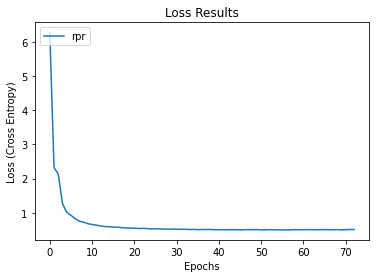

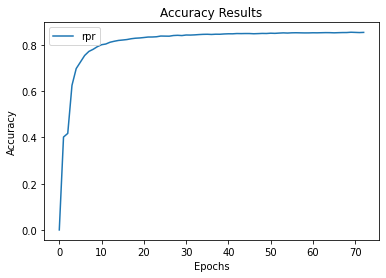

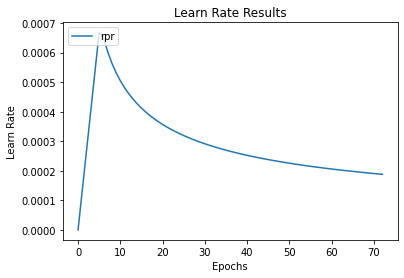

In [41]:
import argparse
import csv
import math
import matplotlib.pyplot as plt

RESULTS_FILE = "results.csv"
EPOCH_IDX = 0
LR_IDX = 1
EVAL_LOSS_IDX = 4
EVAL_ACC_IDX = 5

SPLITTER = '?'


def graph_results(input_dirs="/content/MusicTransformer-Pytorch/rpr/results", output_dir=None, model_names=None, epoch_start=0, epoch_end=None):
    """
    ----------
    Author: Damon Gwinn
    ----------
    Graphs model training and evaluation data
    ----------
    """

    input_dirs = input_dirs.split(SPLITTER)

    if(model_names is not None):
        model_names = model_names.split(SPLITTER)
        if(len(model_names) != len(input_dirs)):
            print("Error: len(model_names) != len(input_dirs)")
            return

    #Initialize Loss and Accuracy arrays
    loss_arrs = []
    accuracy_arrs = []
    epoch_counts = []
    lrs = []

    for input_dir in input_dirs:
        loss_arr = []
        accuracy_arr = []
        epoch_count = []
        lr_arr = []

        f = os.path.join(input_dir, RESULTS_FILE)
        with open(f, "r") as i_stream:
            reader = csv.reader(i_stream)
            next(reader)

            lines = [line for line in reader]

        if(epoch_end is None):
            epoch_end = math.inf

        epoch_start = max(epoch_start, 0)
        epoch_start = min(epoch_start, epoch_end)

        for line in lines:
            epoch = line[EPOCH_IDX]
            lr = line[LR_IDX]
            accuracy = line[EVAL_ACC_IDX]
            loss = line[EVAL_LOSS_IDX]

            if(int(epoch) >= epoch_start and int(epoch) < epoch_end):
                accuracy_arr.append(float(accuracy))
                loss_arr.append(float(loss))
                epoch_count.append(int(epoch))
                lr_arr.append(float(lr))

        loss_arrs.append(loss_arr)
        accuracy_arrs.append(accuracy_arr)
        epoch_counts.append(epoch_count)
        lrs.append(lr_arr)

    if(output_dir is not None):
        try:
            os.mkdir(output_dir)
        except OSError:
            print ("Creation of the directory %s failed" % output_dir)
        else:
            print ("Successfully created the directory %s" % output_dir)

    ##### LOSS #####
    for i in range(len(loss_arrs)):
        if(model_names is None):
            name = None
        else:
            name = model_names[i]

        #Create and save plots to output folder
        plt.plot(epoch_counts[i], loss_arrs[i], label=name)
        plt.title("Loss Results")
        plt.ylabel('Loss (Cross Entropy)')
        plt.xlabel('Epochs')
        fig1 = plt.gcf()

    plt.legend(loc="upper left")

    if(output_dir is not None):
        fig1.savefig(os.path.join(output_dir, 'loss_graph.png'))

    plt.show()

    ##### ACCURACY #####
    for i in range(len(accuracy_arrs)):
        if(model_names is None):
            name = None
        else:
            name = model_names[i]

        #Create and save plots to output folder
        plt.plot(epoch_counts[i], accuracy_arrs[i], label=name)
        plt.title("Accuracy Results")
        plt.ylabel('Accuracy')
        plt.xlabel('Epochs')
        fig2 = plt.gcf()

    plt.legend(loc="upper left")

    if(output_dir is not None):
        fig2.savefig(os.path.join(output_dir, 'accuracy_graph.png'))

    plt.show()

    ##### LR #####
    for i in range(len(lrs)):
        if(model_names is None):
            name = None
        else:
            name = model_names[i]

        #Create and save plots to output folder
        plt.plot(epoch_counts[i], lrs[i], label=name)
        plt.title("Learn Rate Results")
        plt.ylabel('Learn Rate')
        plt.xlabel('Epochs')
        fig2 = plt.gcf()

    plt.legend(loc="upper left")

    if(output_dir is not None):
        fig2.savefig(os.path.join(output_dir, 'lr_graph.png'))

    plt.show()
graph_results('/content/MusicTransformer-Pytorch/rpr/results', model_names='rpr')

In [42]:

%reload_ext tensorboard
import tensorflow as tf
import datetime, os
%tensorboard --logdir /content/MusicTransformer-Pytorch/rpr

<IPython.core.display.Javascript object>

## Generación y Exploración de la creación de composiciones u Output del modelo.

Selecciona el weight con mejor perdida para la creacion de outputs. Inicia con una secuencia fragmento inicial para luego componer y generar una cantidad de tokens.

Finalmente se genera una muestra con 3 archivos:
1. Secuencia creada .midi
2. fragmento inicial .midi
3. Secuencia creada .wav


In [79]:
# Params
#number_of_tokens_to_generate = 1023
number_of_tokens_to_generate = 1080

#priming_sequence_length = 65 
priming_sequence_length = 120

#maximum_possible_output_sequence = 2048
maximum_possible_output_sequence = 2048



select_model = "/content/MusicTransformer-Pytorch/rpr/results/best_loss_weights.pickle"
custom_MIDI = ""

import processor
from processor import encode_midi, decode_midi

!python generate.py -output_dir output -model_weights=$select_model --rpr -target_seq_length=$number_of_tokens_to_generate -num_prime=$priming_sequence_length -max_sequence=$maximum_possible_output_sequence $custom_MIDI #

print('Successfully exported the output to output folder. To primer.mid and rand.mid')

# set the src and play
FluidSynth("/content/font.sf2").midi_to_audio('/content/MusicTransformer-Pytorch/output/rand.mid', '/content/MusicTransformer-Pytorch/output/output.wav')

from google.colab import files


files.download('/content/MusicTransformer-Pytorch/output/rand.mid')
files.download('/content/MusicTransformer-Pytorch/output/primer.mid')

Audio('/content/MusicTransformer-Pytorch/output/output.wav')



midi_root: ./dataset/e_piano/
output_dir: output
primer_file: None
force_cpu: False

target_seq_length: 1080
num_prime: 120
model_weights: /content/MusicTransformer-Pytorch/rpr/results/best_loss_weights.pickle
beam: 0

rpr: True
max_sequence: 2048
n_layers: 6
num_heads: 8
d_model: 512

dim_feedforward: 1024

Using primer index: 147 ( ./dataset/e_piano/test/bwv0244_17.mid.pickle )
RAND DIST
Generating sequence of max length: 1080
150 / 1080
200 / 1080
250 / 1080
300 / 1080
350 / 1080
400 / 1080
450 / 1080
500 / 1080
550 / 1080
600 / 1080
650 / 1080
700 / 1080
750 / 1080
800 / 1080
850 / 1080
900 / 1080
950 / 1080
1000 / 1080
1050 / 1080
info removed pitch: 73
Successfully exported the output to output folder. To primer.mid and rand.mid


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>